- независимость
- полная группа событий
- условная вероятность
- теорема баеса
- формула полной вероятности

# Независимые события

## **Пример**:
> Рассмотрим бросок двух кубиков.
>
> Приведите два примера зависимых и два примера независимых событий.

## **Задача 1 (Le Cinéma)**

> "Врачи говорят шансы на выживание 50 на 50. Хотя вероятность всего 10%."
>
> Как [это](https://www.youtube.com/watch?v=IoHXEd8zB3E) понимать?



## **Задача 2 (Независимые Испытания)**:
> Работник росстата звонит случайному человеку.
> Вероятность того, что ему ответят равна 0.05.
>
> С какой вероятностью работник дозвонится до кого-нибудь за 5 звонков?

## **Задача 3 (Контроль Качества)**:

> На заводе планируют ввести следующую процедуру контроля качества.
> Из партии берут на проверку 10 случайных деталей.
> Если брак не обнаружен, то берут и проверяют ещё 10.
>
> С какой вероятностью брак не будет обнаружен в партии из 1000 деталей среди которых 40 бракованных?

# Условная вероятность. Теорема Байеса.  

> Пусть задано $(\Omega, \mathcal{F}, \mathbb{P}$).
> *Условной вероятностью события $A$ при условии, что произошло событие $B$*, называется число:
>
> \begin{equation}
  \mathbb{P}(A \mid B) = \dfrac{\mathbb{P}(A\cap B)}{\mathbb{P}(B)}, \text{ где } A, B \subset \Omega.
\end{equation}
>
> Замечания
>
> * Если $\mathbb{P}(B) = 0$, то изложенное определение условной вероятности неприменимо.
> * Прямо из определения очевидно следует, что вероятность произведения двух событий равна:
>
> \begin{equation}
  \mathbb{P}(A\cap B) = {P}(A \mid B) {P}(B).
\end{equation}
>
> * Если события $A$ и $B$ независимые, то
>
> \begin{equation}
  \mathbb{P}(A \mid B) = \dfrac{\mathbb{P}(A\cap B)}{\mathbb{P}(B)} = \mathbb{P}(A)
\end{equation}


> *Теорема Байеса*
>
> \begin{equation}
  \mathbb{P}(A \mid B) = \dfrac{\mathbb{P}(A)\mathbb{P}(B \mid A)}{\mathbb{P}(B)}
\end{equation}

## Пример (мишень)

> Стрелок стреляет в круглую мишень радиуса 10.
> Стрелок попадает равновероятно в каждую точку мишени.
>
> Какова вероятность попасть в яблочко, если его радиус равен 1?
>
> Теперь стрелок прицелился и стреляет в центр.
> Он теперь попадает в область радиуса 3 (каждая точка области равновероятна).
>
> Какова вероятность попасть теперь?

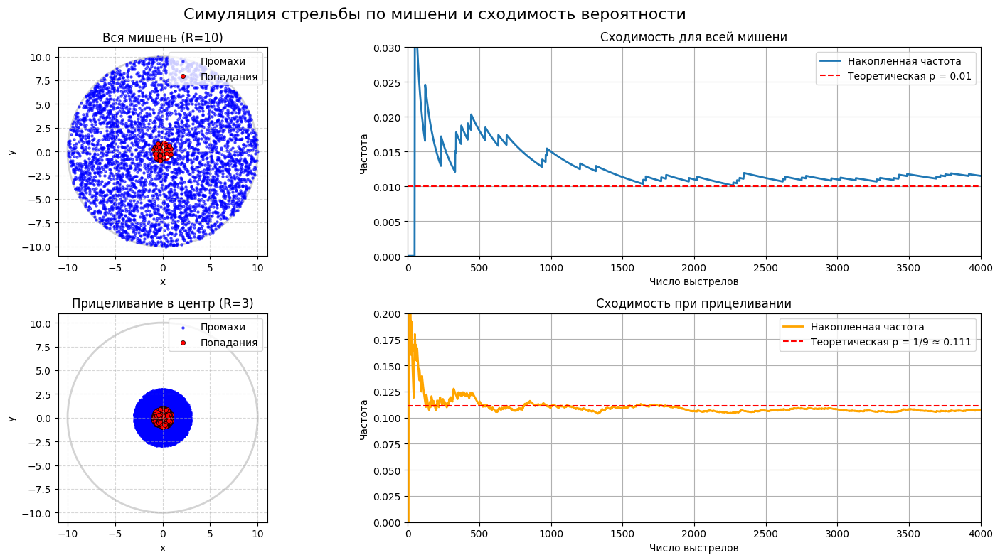

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Параметры
R_target = 10.0
R_bull = 1.0
R_aim = 3.0
total_shots = 4000
step_size = 80
frames = total_shots // step_size

np.random.seed(182)

# --- Генерация данных для первого случая (вся мишень) ---
x1 = np.zeros(total_shots)
y1 = np.zeros(total_shots)
hit1 = np.zeros(total_shots, dtype=bool)

for i in range(total_shots):
    r = R_target * np.sqrt(np.random.random())
    theta = 2 * np.pi * np.random.random()
    x1[i] = r * np.cos(theta)
    y1[i] = r * np.sin(theta)
    hit1[i] = (np.hypot(x1[i], y1[i]) <= R_bull)

# Предварительное формирование данных для каждого кадра (первый случай)
miss_coords1_by_frame = []   # список массивов координат промахов (N_miss x 2)
hit_coords1_by_frame = []    # список массивов координат попаданий (N_hit x 2)
for frame in range(frames):
    n = (frame + 1) * step_size
    hit_mask = hit1[:n]
    # промахи: где hit_mask == False
    miss_coords = np.c_[x1[:n][~hit_mask], y1[:n][~hit_mask]]
    hit_coords = np.c_[x1[:n][hit_mask], y1[:n][hit_mask]]
    miss_coords1_by_frame.append(miss_coords)
    hit_coords1_by_frame.append(hit_coords)

# Накопленная частота (для графика)
cum_hits1 = np.cumsum(hit1)
freq1 = cum_hits1 / np.arange(1, total_shots + 1)

# --- Генерация данных для второго случая (прицеливание) ---
x2 = np.zeros(total_shots)
y2 = np.zeros(total_shots)
hit2 = np.zeros(total_shots, dtype=bool)

for i in range(total_shots):
    r = R_aim * np.sqrt(np.random.random())
    theta = 2 * np.pi * np.random.random()
    x2[i] = r * np.cos(theta)
    y2[i] = r * np.sin(theta)
    hit2[i] = (np.hypot(x2[i], y2[i]) <= R_bull)

miss_coords2_by_frame = []
hit_coords2_by_frame = []
for frame in range(frames):
    n = (frame + 1) * step_size
    hit_mask = hit2[:n]
    miss_coords = np.c_[x2[:n][~hit_mask], y2[:n][~hit_mask]]
    hit_coords = np.c_[x2[:n][hit_mask], y2[:n][hit_mask]]
    miss_coords2_by_frame.append(miss_coords)
    hit_coords2_by_frame.append(hit_coords)

cum_hits2 = np.cumsum(hit2)
freq2 = cum_hits2 / np.arange(1, total_shots + 1)

# --- Построение фигуры ---
fig = plt.figure(figsize=(16, 8))
fig.suptitle('Симуляция стрельбы по мишени и сходимость вероятности', fontsize=16)

# Мишени
ax_m1 = plt.subplot(2, 2, 1)
ax_m2 = plt.subplot(2, 2, 3)
# Графики вероятностей
ax_p1 = plt.subplot(2, 2, 2)
ax_p2 = plt.subplot(2, 2, 4)

# Настройка мишеней
for ax, title in zip([ax_m1, ax_m2], ['Вся мишень (R=10)', 'Прицеливание в центр (R=3)']):
    ax.add_patch(plt.Circle((0, 0), R_target, color='lightgray', fill=False, lw=2))
    ax.add_patch(plt.Circle((0, 0), R_bull, color='red', fill=False, lw=2, ls='--'))
    if ax == ax_m2:
        ax.add_patch(plt.Circle((0, 0), R_aim, color='blue', fill=False, lw=2, ls=':'))
    ax.set_xlim(-R_target*1.1, R_target*1.1)
    ax.set_ylim(-R_target*1.1, R_target*1.1)
    ax.set_aspect('equal')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(title)
    ax.grid(True, ls='--', alpha=0.5)

# Scatter объекты (промахи — синие, попадания — красные)
miss_scat1 = ax_m1.scatter([], [], s=5, color='blue', alpha=0.6, label='Промахи')
hit_scat1 = ax_m1.scatter([], [], s=20, color='red', edgecolor='black', lw=0.5, label='Попадания')
miss_scat2 = ax_m2.scatter([], [], s=5, color='blue', alpha=0.6, label='Промахи')
hit_scat2 = ax_m2.scatter([], [], s=20, color='red', edgecolor='black', lw=0.5, label='Попадания')
ax_m1.legend(loc='upper right')
ax_m2.legend(loc='upper right')

# Графики вероятностей
line_p1, = ax_p1.plot([], [], lw=2, label='Накопленная частота')
ax_p1.axhline(y=0.01, color='red', ls='--', label='Теоретическая p = 0.01')
ax_p1.set_xlim(0, total_shots)
ax_p1.set_ylim(0, 0.03)
ax_p1.set_xlabel('Число выстрелов')
ax_p1.set_ylabel('Частота')
ax_p1.set_title('Сходимость для всей мишени')
ax_p1.legend()
ax_p1.grid(True)

line_p2, = ax_p2.plot([], [], lw=2, color='orange', label='Накопленная частота')
ax_p2.axhline(y=1/9, color='red', ls='--', label='Теоретическая p = 1/9 ≈ 0.111')
ax_p2.set_xlim(0, total_shots)
ax_p2.set_ylim(0, 0.2)
ax_p2.set_xlabel('Число выстрелов')
ax_p2.set_ylabel('Частота')
ax_p2.set_title('Сходимость при прицеливании')
ax_p2.legend()
ax_p2.grid(True)

plt.tight_layout()

# --- Анимация (только подстановка готовых данных) ---
def animate(frame):
    # Обновляем точки на мишенях
    miss_scat1.set_offsets(miss_coords1_by_frame[frame])
    hit_scat1.set_offsets(hit_coords1_by_frame[frame])
    miss_scat2.set_offsets(miss_coords2_by_frame[frame])
    hit_scat2.set_offsets(hit_coords2_by_frame[frame])

    # Обновляем графики вероятностей
    n = (frame + 1) * step_size
    line_p1.set_data(np.arange(1, n+1), freq1[:n])
    line_p2.set_data(np.arange(1, n+1), freq2[:n])

    return (miss_scat1, hit_scat1, miss_scat2, hit_scat2,
            line_p1, line_p2)

anim = FuncAnimation(fig, animate, frames=frames, interval=200, blit=True)

plt.rcParams['animation.html'] = 'jshtml'
HTML(anim.to_jshtml())

## **Задача 4 (Хорощее дело "браком" не назовут)**:

> По статистике ВЦИОМ 8 из 10 браков оканчиваются разводом.
> Причём 40 из 100 разводов обусловлены проблемами с жильём.
> Известно также что каждая вторая пара испытывает проблемы с жильём.
>
> Какова вероятность развода при условии что у новобрачных нет собственного жилья (считаем это проблемой)?

## **Задача 5 (Неочевидные выводы)**:

> Пусть существует заболевание с частотой распространения среди населения 0,05 и метод диагностического обследования, который с вероятностью 0,8 выявляет больного, но при этом имеет вероятность 0,05 ложноположительного результата — ошибочного выявления заболевания у здорового человека.
>
> Найдите вероятность того, что человек здоров, если он был признан больным при обследовании.


## **Задача 6 (Студенты)**:

> Имеется 5 групп студентов.
> В первых 3-ёх по 2 математика и 3 программиста.
> В последних двух по 1 математику и 4 программиста.
>
> С какой вероятностью случайно выбранный студент принадлежит одной из последних двух групп, если он математик?

# Полная группа событий. Формула полной вероятности.

> Полная группа событий — это набор событий $H_1, H_2, \dots, H_n$, которые:
>    
> * попарно несовместны: $H_i \cap H_j = \varnothing$ при $i \neq j$;
>
> * в сумме дают достоверное событие: $\bigcup_{i=1}^{n} H_i = \Omega$.
>
> Для любого события $A$ справедлива формула полной вероятности:
>
> \begin{equation}
  P(A) = \sum_{i=1}^{n} P(H_i) \cdot P(A \mid H_i).
\end{equation}

## Пример 1:

> Приведите пример полной группы событий при броске двух кубиков

## Пример 2:

> На заводе работают две линии.
> Первая линия производит 60% всей продукции, вторая — 40%.
> Вероятность брака на первой линии составляет 1%, на второй — 2%.
>
> Найти вероятность того, что случайно выбранное изделие окажется бракованным.

## **Задача 7 (Дела Семейные)**

> Известно, что при рождении близнецов вероятность того, что близнецы будут одного пола в два раза больше, чем вероятность того, что близнецы будут разных полов.
> Известно также, что вероятность рождения той или иной пары ребят не зависит от конкретного пола.
> То есть важно именно того, одинакового ли пола близнецы, или нет.   
>
> С какой вероятностью второй близнец будет мальчиком, если известно, что первый близнец — мальчик?

## **Задача 8 (Отказоустойчивость)**

> Рассмотрим сеть со следующей топологией.
>
> 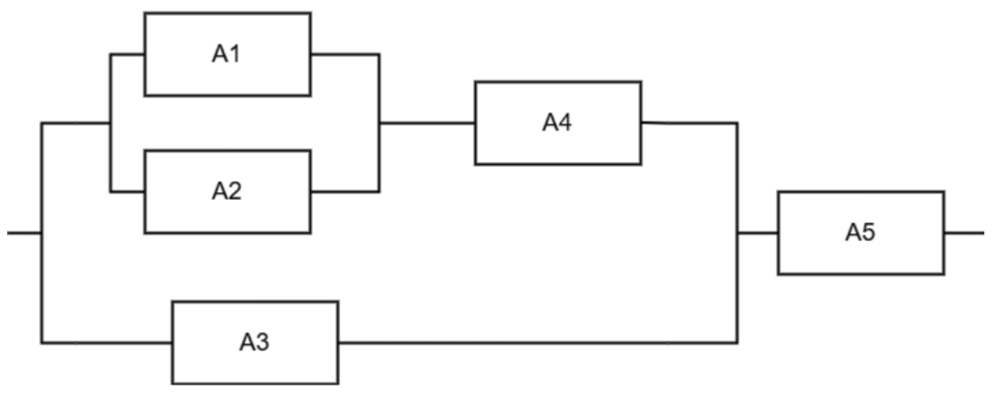
> Найдите вероятность того, что передача не дойдет из начала в конец, если узлы ломаются независимо с заранее заданными вероятностями.

## **Задача 9 (Погромисты)**:

> Три программиста на своих серверах иногда роняют сервер (условно раз в месяц), причем первый и второй из них роняют сервер с вероятностью 0,1, а третий – с вероятностью 0,2.
> Один из этих рабочих проработал 8 месяцев, среди которых 2 раза уронил сервер.
>
> Какова вероятность, что среди следующих 8 месяцев, тот же программист уронит сервер лишь дважды?


# Деп (Парадокс Монти-Холла)

> Представьте, что вы стали участником игры, в которой вам нужно выбрать одну из трёх дверей.
> За одной из дверей находится автомобиль, за двумя другими дверями — козы.
> Вы выбираете одну из дверей, например, номер 1, после этого ведущий, который знает, где находится автомобиль, а где — козы, открывает одну из оставшихся дверей, например, номер 3, за которой находится коза.
> После этого он спрашивает вас — не желаете ли вы изменить свой выбор и выбрать дверь номер 2?
> Увеличатся ли ваши шансы выиграть автомобиль, если вы примете предложение ведущего и измените свой выбор?